# FRSign - French Railway Signalling Dataset - Detectron2 example

### Abstract

In the realm of autonomous transportation, there have been many initiatives for open-sourcing self-driving cars datasets, but much less for alternative methods of transportation such as trains. 

In this paper, we aim to bridge the gap by introducing **FRSign, a large-scale and accurate dataset for vision-based railway traffic light detection and recognition**. 

Our recordings were made on selected running trains in France and benefited from carefully hand-labeled annotations. 

An illustrative dataset which corresponds to ten percent of the acquired data to date is published in open source with the paper. It contains **more than 100,000 images illustrating six types of French railway traffic lights and their possible color combinations**, together with the relevant information regarding their acquisition such as date, time, sensor parameters, and bounding boxes. This dataset is published in open-source at the address [frsign.irt-systemx.fr](frsign.irt-systemx.fr).

We compare, analyze various properties of the dataset and provide metrics to express its variability. We also discuss specific challenges and particularities related to autonomous trains in comparison to autonomous cars.


### License

This work was made possible thanks to IRT SystemX, SNCF, and Alstom.

<a rel="license" href="http://creativecommons.org/licenses/by-nc-sa/4.0/"><img alt="Creative Commons License" style="border-width:0" src="https://i.creativecommons.org/l/by-nc-sa/4.0/88x31.png" /></a><br />This work is licensed under a <a rel="license" href="http://creativecommons.org/licenses/by-nc-sa/4.0/">Creative Commons Attribution-NonCommercial-ShareAlike 4.0 International License</a>.

### 0. Download the FRSign dataset

**WARNING:** The full FRSign dataset size is 294GB.

Make sure your instance has enough disk space for extracting this zip file, plus the extra space required for copying and flattening the images chosen for our example (estimated in around 20GB additional).

A total of at least 600GB is recommended.

In [ ]:
!wget https://frsign.irt-systemx.fr/download/FRSign.tar.gz --no-check-certificate

In [ ]:
!unzip FRSign.tar.gz && rm FRSign.tar.gz

### 1. Read HDF5 file content

The dataset FRSign contains two types of files:
* An HDF5 file called "frsign\_v1.0.h5": this file lists all the images contained in the dataset with their corresponding metadata. The structure of the HDF5 file is explained hereafter.
* Image files: all the images have been saved in PNG format. Their descriptions can be found in the HDF5 file.

Let's read the HDF5 store using pandas.

In [1]:
import pandas as pd
pd.set_option('display.max_colwidth', None)

In [2]:
# HDF5 file path
store_path = "frsign_v1.0.h5"

# Read dataframes stored in HDF5 file
store = pd.HDFStore(store_path, mode='r')
df = store.select('dataframe')
im_df = store.select('images')

### 2. Understand the data

The HDF5 file "frsign\_v1.0.h5" contains two dataframes named: 
* `/dataframe`: dataframe which contains the metadata related to all video sequences. 
* `/images`: dataframe with a double index that lists images according to their chronological order in a sequence as well as their corresponding bounding boxes. 

Hereafter is the description of the columns found in `/dataframe`:

* `camera`: Identifier of the camera that was used.
* `CameraInfo_bayerTileFormat`: Bayer tile format.
* `CameraInfo_sensorResolution`: Sensor resolution (`width` x `height`).
* `context`: Context of the recording (train in our case).
* `datetime`: Date and timestamp of the recording.
* `fps`: Frame per second.
* `image_format`: Image format (PNG).
* `on_track`: Boolean that indicates whether the railway panel is on the same track as the train.
* `optic`: Selected optic for the acquisition.
* `sensor_id`: Unique sensor identifier.
* `sensor_type`: Type of sensor that was used (camera in our case).
* `state`: State of the railway panel.
* `type`: Type of the railway panel.    
* `video_name`: Name of the video file.
* `video`: Video filepath. 

The index of `/dataframe` creates a unique identifier for each video sequence found in the table.

In [3]:
df

,CameraInfo_bayerTileFormat,CameraInfo_sensorResolution,context,datetime,fps,sensor_id,sensor_type,state,type,on_track,video,video_name,optic,image_format
sequence,,,,,,,,,,,,,,
83,RGGB,1920x1200,train,2018-10-11 15:59:43.700,20.0,camera_2,camera,Feu rouge clignotant (1 feu rouge clignotant),Chassis A (3 feux verticaux),True,Database/acquisitions/20181011/20181011_153137/camera_2/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image.avi,RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image.avi,25,PNG8
124,RGGB,1920x1200,train,2018-10-11 16:10:28.650,20.0,camera_2,camera,Feu rouge clignotant (1 feu rouge clignotant),Chassis C (5 feux verticaux),True,Database/acquisitions/20181011/20181011_153137/camera_2/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image.avi,RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image.avi,25,PNG8
128,RGGB,1920x1200,train,2018-10-11 16:11:28.150,20.0,camera_2,camera,Feu rouge clignotant (1 feu rouge clignotant),Chassis A (3 feux verticaux),True,Database/acquisitions/20181011/20181011_153137/camera_2/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image.avi,RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image.avi,25,PNG8
129,RGGB,1920x1200,train,2018-10-11 16:11:37.000,20.0,camera_2,camera,Feu rouge clignotant (1 feu rouge clignotant),Chassis A (3 feux verticaux),True,Database/acquisitions/20181011/20181011_153137/camera_2/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image.avi,RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image.avi,25,PNG8
164,RGGB,1920x1200,train,2018-10-11 16:24:12.850,20.0,camera_2,camera,Rappel 60 (2 feux jaunes clignotants verticaux),Chassis H (6 & 3 feux en S),True,Database/acquisitions/20181011/20181011_153137/camera_2/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image.avi,RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image.avi,25,PNG8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3829,RGGB,1920x1200,train,2018-01-25 16:24:46.750,20.0,camera_2,camera,Semaphore (1 feu rouge),Chassis A (3 feux verticaux),False,Database/acquisitions/20180125/20180125_160009/camera_2/RecFile_7_20180125_160010_pointgrey_flycapture2_3_ipl_image.avi,RecFile_7_20180125_160010_pointgrey_flycapture2_3_ipl_image.avi,25,PNG8
4132,RGGB,1920x1200,train,2018-01-25 17:26:08.100,20.0,camera_2,camera,Semaphore (1 feu rouge),Chassis A (3 feux verticaux),False,Database/acquisitions/20180125/20180125_165335/camera_2/RecFile_7_20180125_165338_pointgrey_flycapture2_3_ipl_image.avi,RecFile_7_20180125_165338_pointgrey_flycapture2_3_ipl_image.avi,25,PNG8
3887,GBRG,2048x1536,train,2018-01-25 17:02:13.500,20.0,camera_1,camera,Semaphore (1 feu rouge),Chassis H (6 & 3 feux en S),True,Database/acquisitions/20180125/20180125_165335/camera_1/RecFile_7_20180125_165220_pointgrey_flycapture2_3_ipl_image.avi,RecFile_7_20180125_165220_pointgrey_flycapture2_3_ipl_image.avi,12,PNG8


In [4]:
#Filter out for keeping only those with resolution 1920x1200 (for simplicity)
df_filter = df[df['CameraInfo_sensorResolution']=='1920x1200']
df_filter

,CameraInfo_bayerTileFormat,CameraInfo_sensorResolution,context,datetime,fps,sensor_id,sensor_type,state,type,on_track,video,video_name,optic,image_format
sequence,,,,,,,,,,,,,,
83,RGGB,1920x1200,train,2018-10-11 15:59:43.700,20.0,camera_2,camera,Feu rouge clignotant (1 feu rouge clignotant),Chassis A (3 feux verticaux),True,Database/acquisitions/20181011/20181011_153137/camera_2/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image.avi,RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image.avi,25,PNG8
124,RGGB,1920x1200,train,2018-10-11 16:10:28.650,20.0,camera_2,camera,Feu rouge clignotant (1 feu rouge clignotant),Chassis C (5 feux verticaux),True,Database/acquisitions/20181011/20181011_153137/camera_2/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image.avi,RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image.avi,25,PNG8
128,RGGB,1920x1200,train,2018-10-11 16:11:28.150,20.0,camera_2,camera,Feu rouge clignotant (1 feu rouge clignotant),Chassis A (3 feux verticaux),True,Database/acquisitions/20181011/20181011_153137/camera_2/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image.avi,RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image.avi,25,PNG8
129,RGGB,1920x1200,train,2018-10-11 16:11:37.000,20.0,camera_2,camera,Feu rouge clignotant (1 feu rouge clignotant),Chassis A (3 feux verticaux),True,Database/acquisitions/20181011/20181011_153137/camera_2/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image.avi,RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image.avi,25,PNG8
164,RGGB,1920x1200,train,2018-10-11 16:24:12.850,20.0,camera_2,camera,Rappel 60 (2 feux jaunes clignotants verticaux),Chassis H (6 & 3 feux en S),True,Database/acquisitions/20181011/20181011_153137/camera_2/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image.avi,RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image.avi,25,PNG8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
626,RGGB,1920x1200,train,2019-01-24 10:18:56.500,20.0,camera_2,camera,Semaphore (1 feu rouge),Chassis A (3 feux verticaux),False,Database/acquisitions/20190124/20190124_101004/camera_2/RecFile_1_20190124_101053_pointgrey_flycapture2_1_ipl_image.avi,RecFile_1_20190124_101053_pointgrey_flycapture2_1_ipl_image.avi,25,PNG8
2643,RGGB,1920x1200,train,2018-01-11 11:04:11.650,20.0,camera_2,camera,Semaphore (1 feu rouge),Chassis A (3 feux verticaux),False,Database/acquisitions/20180111/20180111_100856/camera_2/RecFile_7_20180111_100948_pointgrey_flycapture2_3_ipl_image.avi,RecFile_7_20180111_100948_pointgrey_flycapture2_3_ipl_image.avi,25,PNG8
3829,RGGB,1920x1200,train,2018-01-25 16:24:46.750,20.0,camera_2,camera,Semaphore (1 feu rouge),Chassis A (3 feux verticaux),False,Database/acquisitions/20180125/20180125_160009/camera_2/RecFile_7_20180125_160010_pointgrey_flycapture2_3_ipl_image.avi,RecFile_7_20180125_160010_pointgrey_flycapture2_3_ipl_image.avi,25,PNG8


Hereafter is the description of the columns found in  `/images`:

* `fullpath`: Image filepath.
* `x` : Abscissa of the upper left corner of the bounding box.
* `y` : Ordinate of the upper left corner of the bounding box.
* `w` : Width of the bounding box. 
* `h` : Height of the bounding box. 

The double index of `/images` serves to, first, identify the video sequence that contains the image, and second, create a unique identifier for the image.

In [18]:
im_df

fullpath  \
sequence image                                                                              
83       0      RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33734_rgb.png   
         1      RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33735_rgb.png   
         2      RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33736_rgb.png   
         3      RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33737_rgb.png   
         4      RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33738_rgb.png   
...                                                                                   ...   
1149     677    RecFile_1_20190124_135313_pointgrey_flycapture2_1_ipl_image/19525_rgb.png   
         678    RecFile_1_20190124_135313_pointgrey_flycapture2_1_ipl_image/19526_rgb.png   
         679    RecFile_1_20190124_135313_pointgrey_flycapture2_1_ipl_image/19527_rgb.png   
         680    RecFile_1_20190124_135313_pointgrey_flycapture2_1_ipl_image/19528_rgb.png   
         681    RecFile_1_20190124_135313_pointgrey_flycapture2_1_ipl_image/19529_rgb.png   

                  x    y   w    h  
sequence image                     
83       0      882  528  15   21  
         1      882  528  15   21  
         2      882  528  15   21  
         3      882  528  15   21  
         4      882  528  15   21  
...             ...  ...  ..  ...  
1149     677    583  219  75  177  
         678    583  219  75  177  
         679    583  219  75  177  
         680    583  219  75  177  
         681    583  219  75  177  

[105352 rows x 5 columns]

In [17]:
im_df_filter = im_df[im_df.index.get_level_values(0).isin(df_filter.index.get_level_values(0))]
im_df_filter

fullpath  \
sequence image                                                                              
83       0      RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33734_rgb.png   
         1      RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33735_rgb.png   
         2      RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33736_rgb.png   
         3      RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33737_rgb.png   
         4      RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33738_rgb.png   
...                                                                                   ...   
1149     677    RecFile_1_20190124_135313_pointgrey_flycapture2_1_ipl_image/19525_rgb.png   
         678    RecFile_1_20190124_135313_pointgrey_flycapture2_1_ipl_image/19526_rgb.png   
         679    RecFile_1_20190124_135313_pointgrey_flycapture2_1_ipl_image/19527_rgb.png   
         680    RecFile_1_20190124_135313_pointgrey_flycapture2_1_ipl_image/19528_rgb.png   
         681    RecFile_1_20190124_135313_pointgrey_flycapture2_1_ipl_image/19529_rgb.png   

                  x    y   w    h  
sequence image                     
83       0      882  528  15   21  
         1      882  528  15   21  
         2      882  528  15   21  
         3      882  528  15   21  
         4      882  528  15   21  
...             ...  ...  ..  ...  
1149     677    583  219  75  177  
         678    583  219  75  177  
         679    583  219  75  177  
         680    583  219  75  177  
         681    583  219  75  177  

[66442 rows x 5 columns]

### 2.1 Preparing data for Detectro2 example...

In [21]:
#Let's prepare the annotations, as per the Detectron2 example...
annotations = pd.DataFrame(list(zip(im_df_filter.fullpath.to_list(), im_df_filter.x.to_list(), im_df_filter.y.to_list(), (im_df_filter.x + im_df_filter.w).to_list(), (im_df_filter.y + im_df_filter.h).to_list(), df_filter.loc[im_df_filter.index.get_level_values(0)].type.to_list(), df_filter.loc[im_df_filter.index.get_level_values(0)].CameraInfo_sensorResolution.str.split('x').str[0], df_filter.loc[im_df_filter.index.get_level_values(0)].CameraInfo_sensorResolution.str.split('x').str[1])), columns=['image_name', 'x1', 'y1', 'x2', 'y2', 'class', 'image_width', 'image_height'])
annotations

,image_name,x1,y1,x2,y2,class,image_width,image_height
0,RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33734_rgb.png,882,528,897,549,Chassis A (3 feux verticaux),1920,1200
1,RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33735_rgb.png,882,528,897,549,Chassis A (3 feux verticaux),1920,1200
2,RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33736_rgb.png,882,528,897,549,Chassis A (3 feux verticaux),1920,1200
3,RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33737_rgb.png,882,528,897,549,Chassis A (3 feux verticaux),1920,1200
4,RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33738_rgb.png,882,528,897,549,Chassis A (3 feux verticaux),1920,1200
...,...,...,...,...,...,...,...,...
66437,RecFile_1_20190124_135313_pointgrey_flycapture2_1_ipl_image/19525_rgb.png,583,219,658,396,Chassis C (5 feux verticaux),1920,1200
66438,RecFile_1_20190124_135313_pointgrey_flycapture2_1_ipl_image/19526_rgb.png,583,219,658,396,Chassis C (5 feux verticaux),1920,1200
66439,RecFile_1_20190124_135313_pointgrey_flycapture2_1_ipl_image/19527_rgb.png,583,219,658,396,Chassis C (5 feux verticaux),1920,1200
66440,RecFile_1_20190124_135313_pointgrey_flycapture2_1_ipl_image/19528_rgb.png,583,219,658,396,Chassis C (5 feux verticaux),1920,1200


In [56]:
#Double-check and remove any images with a resolution different to 1920x1200 (for simplicity)...
import PIL
from PIL import Image

annotations['size'] = ''

for idx, key in enumerate(annotations['image_name']):
    img = PIL.Image.open('/home/ec2-user/SageMaker/FRSign/data/datasets/frsign/FRSign_modified/FRSign/images/'+key)
    wid, hgt = img.size
    if (wid == 1920):
        annotations.at[idx, 'size'] = 'OK'
    else:
        annotations.at[idx, 'size'] = 'NOT'

annotations

0 RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33734_rgb.png
1 RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33735_rgb.png
2 RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33736_rgb.png
3 RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33737_rgb.png
4 RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33738_rgb.png
5 RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33739_rgb.png
6 RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33740_rgb.png
7 RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33741_rgb.png
8 RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33742_rgb.png
9 RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33743_rgb.png
10 RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33744_rgb.png
11 RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33745_rgb.png
12 RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33746_rgb.png
13 RecFil

,image_name,x1,y1,x2,y2,class,image_width,image_height,size
0,RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33734_rgb.png,882,528,897,549,Chassis A (3 feux verticaux),1920,1200,OK
1,RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33735_rgb.png,882,528,897,549,Chassis A (3 feux verticaux),1920,1200,OK
2,RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33736_rgb.png,882,528,897,549,Chassis A (3 feux verticaux),1920,1200,OK
3,RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33737_rgb.png,882,528,897,549,Chassis A (3 feux verticaux),1920,1200,OK
4,RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33738_rgb.png,882,528,897,549,Chassis A (3 feux verticaux),1920,1200,OK
...,...,...,...,...,...,...,...,...,...
66437,RecFile_1_20190124_135313_pointgrey_flycapture2_1_ipl_image/19525_rgb.png,583,219,658,396,Chassis C (5 feux verticaux),1920,1200,OK
66438,RecFile_1_20190124_135313_pointgrey_flycapture2_1_ipl_image/19526_rgb.png,583,219,658,396,Chassis C (5 feux verticaux),1920,1200,OK
66439,RecFile_1_20190124_135313_pointgrey_flycapture2_1_ipl_image/19527_rgb.png,583,219,658,396,Chassis C (5 feux verticaux),1920,1200,OK
66440,RecFile_1_20190124_135313_pointgrey_flycapture2_1_ipl_image/19528_rgb.png,583,219,658,396,Chassis C (5 feux verticaux),1920,1200,OK


In [60]:
annotations.groupby('size').nunique()

,image_name,x1,y1,x2,y2,class,image_width,image_height
size,,,,,,,,
NOT,1251,518,335,475,282,3,1,1
OK,58399,2030,930,1955,829,7,1,1


In [65]:
annotations = annotations[annotations['size'] == 'OK']
annotations.drop('size', axis=1, inplace=True)
annotations

,image_name,x1,y1,x2,y2,class,image_width,image_height
0,RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33734_rgb.png,882,528,897,549,Chassis A (3 feux verticaux),1920,1200
1,RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33735_rgb.png,882,528,897,549,Chassis A (3 feux verticaux),1920,1200
2,RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33736_rgb.png,882,528,897,549,Chassis A (3 feux verticaux),1920,1200
3,RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33737_rgb.png,882,528,897,549,Chassis A (3 feux verticaux),1920,1200
4,RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image/33738_rgb.png,882,528,897,549,Chassis A (3 feux verticaux),1920,1200
...,...,...,...,...,...,...,...,...
66437,RecFile_1_20190124_135313_pointgrey_flycapture2_1_ipl_image/19525_rgb.png,583,219,658,396,Chassis C (5 feux verticaux),1920,1200
66438,RecFile_1_20190124_135313_pointgrey_flycapture2_1_ipl_image/19526_rgb.png,583,219,658,396,Chassis C (5 feux verticaux),1920,1200
66439,RecFile_1_20190124_135313_pointgrey_flycapture2_1_ipl_image/19527_rgb.png,583,219,658,396,Chassis C (5 feux verticaux),1920,1200
66440,RecFile_1_20190124_135313_pointgrey_flycapture2_1_ipl_image/19528_rgb.png,583,219,658,396,Chassis C (5 feux verticaux),1920,1200


In [66]:
annotations.to_csv('annotations.csv', index=False, header=None)

In [67]:
train=annotations.sample(frac=0.07,random_state=200) #random state is a seed value
testval=annotations.drop(train.index)
test=testval.sample(frac=0.025, random_state=200)
testval=annotations.drop(test.index)
val=testval.sample(frac=0.005, random_state=200)
print('train:', train.shape[0], 'images,', "%.1f"%((train.shape[0]/annotations.shape[0])*100), '% of total')
print('test:', test.shape[0], 'images,', "%.1f"%((test.shape[0]/annotations.shape[0])*100), '% of total')
print('val:', val.shape[0], 'images,', "%.1f"%((val.shape[0]/annotations.shape[0])*100), '% of total')

train: 4560 images, 7.0 % of total
test: 1515 images, 2.3 % of total
val: 318 images, 0.5 % of total


In [68]:
#Copy and flatten training images:
train_tmp = train.copy()
train_tmp.reset_index(inplace=True)

for idx in train_tmp.index:
    temp_dir=(train_tmp.iloc[idx].image_name.split('/')[0])
    temp_file=(train_tmp.iloc[idx].image_name.split('/')[1])
    #new_file=(temp_dir[:26]+temp_file)
    new_file=(temp_dir+temp_file)
    !cp '/home/ec2-user/SageMaker/FRSign/data/datasets/frsign/FRSign_modified/FRSign/images/'$temp_dir'/'$temp_file '/home/ec2-user/SageMaker/FRSign/amazon-sagemaker-pytorch-detectron2/cache/FRSign/training/'$new_file
    train_tmp.iat[idx,1] = new_file

train_tmp

,index,image_name,x1,y1,x2,y2,class,image_width,image_height
0,52519,RecFile_7_20180111_100948_pointgrey_flycapture2_3_ipl_image87954_rgb.png,801,-10,1010,77,Chassis ID3 (3 feux horizontaux),1920,1200
1,52717,RecFile_7_20180111_100948_pointgrey_flycapture2_3_ipl_image88152_rgb.png,803,-10,1012,77,Chassis ID3 (3 feux horizontaux),1920,1200
2,21479,RecFile_7_20180125_165338_pointgrey_flycapture2_3_ipl_image47638_rgb.png,1536,477,1567,519,Chassis F (6 & 1 feux en L inverse),1920,1200
3,41758,RecFile_7_20180308_101533_pointgrey_flycapture2_3_ipl_image22033_rgb.png,411,28,520,79,Chassis ID3 (3 feux horizontaux),1920,1200
4,18832,RecFile_7_20180308_113914_pointgrey_flycapture2_3_ipl_image62947_rgb.png,470,315,562,449,Chassis H (6 & 3 feux en S),1920,1200
...,...,...,...,...,...,...,...,...,...
4555,41727,RecFile_7_20180308_101533_pointgrey_flycapture2_3_ipl_image22002_rgb.png,411,28,520,79,Chassis ID3 (3 feux horizontaux),1920,1200
4556,14756,RecFile_7_20180308_113914_pointgrey_flycapture2_3_ipl_image60136_rgb.png,815,453,862,519,Chassis F (6 & 1 feux en L inverse),1920,1200
4557,41211,RecFile_7_20180308_101533_pointgrey_flycapture2_3_ipl_image21486_rgb.png,676,302,731,329,Chassis ID3 (3 feux horizontaux),1920,1200
4558,59252,RecFile_7_20180125_160010_pointgrey_flycapture2_3_ipl_image35107_rgb.png,1397,599,1429,653,Chassis A (3 feux verticaux),1920,1200


In [69]:
train_tmp.to_csv('/home/ec2-user/SageMaker/FRSign/amazon-sagemaker-pytorch-detectron2/cache/FRSign/annotations/annotations_train.csv', index=False, header=None)

In [70]:
#Copy and flatten test images:
test_tmp = test.copy()
test_tmp.reset_index(inplace=True)

for idx in test_tmp.index:
    temp_dir=(test_tmp.iloc[idx].image_name.split('/')[0])
    temp_file=(test_tmp.iloc[idx].image_name.split('/')[1])
    #new_file=(temp_dir[:26]+temp_file)
    new_file=(temp_dir+temp_file)
    !cp '/home/ec2-user/SageMaker/FRSign/data/datasets/frsign/FRSign_modified/FRSign/images/'$temp_dir'/'$temp_file '/home/ec2-user/SageMaker/FRSign/amazon-sagemaker-pytorch-detectron2/cache/FRSign/test/'$new_file
    test_tmp.iat[idx,1] = new_file

test_tmp

,index,image_name,x1,y1,x2,y2,class,image_width,image_height
0,51980,RecFile_7_20180125_114519_pointgrey_flycapture2_3_ipl_image44599_rgb.png,144,78,415,201,Chassis ID3 (3 feux horizontaux),1920,1200
1,42714,RecFile_7_20180125_114519_pointgrey_flycapture2_3_ipl_image13125_rgb.png,694,232,757,263,Chassis ID3 (3 feux horizontaux),1920,1200
2,57514,RecFile_7_20180125_160010_pointgrey_flycapture2_3_ipl_image33369_rgb.png,1041,571,1062,603,Chassis A (3 feux verticaux),1920,1200
3,12977,RecFile_7_20180308_101533_pointgrey_flycapture2_3_ipl_image42625_rgb.png,729,517,788,601,Chassis F (6 & 1 feux en L inverse),1920,1200
4,9381,RecFile_7_20180125_160010_pointgrey_flycapture2_3_ipl_image30060_rgb.png,688,440,723,488,Chassis H (6 & 3 feux en S),1920,1200
...,...,...,...,...,...,...,...,...,...
1510,40513,RecFile_7_20180308_101533_pointgrey_flycapture2_3_ipl_image20788_rgb.png,875,455,900,469,Chassis ID3 (3 feux horizontaux),1920,1200
1511,15884,RecFile_7_20180308_153218_pointgrey_flycapture2_3_ipl_image5962_rgb.png,582,134,740,400,Chassis H (6 & 3 feux en S),1920,1200
1512,36364,RecFile_7_20180308_101533_pointgrey_flycapture2_3_ipl_image51048_rgb.png,442,219,510,339,Chassis A (3 feux verticaux),1920,1200
1513,32456,RecFile_7_20180308_113914_pointgrey_flycapture2_3_ipl_image22886_rgb.png,1297,531,1332,590,Chassis A (3 feux verticaux),1920,1200


In [71]:
test_tmp.to_csv('/home/ec2-user/SageMaker/FRSign/amazon-sagemaker-pytorch-detectron2/cache/FRSign/annotations/annotations_test.csv', index=False, header=None)

In [72]:
#Copy and flatten validation images:
val_tmp = val.copy()
val_tmp.reset_index(inplace=True)

for idx in val_tmp.index:
    temp_dir=(val_tmp.iloc[idx].image_name.split('/')[0])
    temp_file=(val_tmp.iloc[idx].image_name.split('/')[1])
    #new_file=(temp_dir[:26]+temp_file)
    new_file=(temp_dir+temp_file)
    !cp '/home/ec2-user/SageMaker/FRSign/data/datasets/frsign/FRSign_modified/FRSign/images/'$temp_dir'/'$temp_file '/home/ec2-user/SageMaker/FRSign/amazon-sagemaker-pytorch-detectron2/cache/FRSign/validation/'$new_file
    val_tmp.iat[idx,1] = new_file

val_tmp

,index,image_name,x1,y1,x2,y2,class,image_width,image_height
0,9231,RecFile_7_20180125_160010_pointgrey_flycapture2_3_ipl_image28845_rgb.png,840,452,881,508,Chassis F (6 & 1 feux en L inverse),1920,1200
1,39866,RecFile_7_20180308_101533_pointgrey_flycapture2_3_ipl_image23022_rgb.png,714,21,822,72,Chassis ID3 (3 feux horizontaux),1920,1200
2,38769,RecFile_7_20180308_101533_pointgrey_flycapture2_3_ipl_image53453_rgb.png,442,219,511,339,Chassis A (3 feux verticaux),1920,1200
3,57331,RecFile_7_20180125_160010_pointgrey_flycapture2_3_ipl_image33186_rgb.png,963,565,982,595,Chassis A (3 feux verticaux),1920,1200
4,26364,RecFile_1_20190124_111149_pointgrey_flycapture2_1_ipl_image432_rgb.png,252,573,302,657,Chassis H (6 & 3 feux en S),1920,1200
...,...,...,...,...,...,...,...,...,...
313,64950,RecFile_1_20181115_092834_pointgrey_flycapture2_1_ipl_image21129_rgb.png,931,557,959,589,Chassis A (3 feux verticaux),1920,1200
314,38739,RecFile_7_20180308_101533_pointgrey_flycapture2_3_ipl_image53423_rgb.png,442,219,511,339,Chassis A (3 feux verticaux),1920,1200
315,63920,RecFile_7_20171109_114509_pointgrey_flycapture2_3_ipl_image6202_rgb.png,711,-77,799,96,Chassis C (5 feux verticaux),1920,1200
316,26955,RecFile_7_20180111_100948_pointgrey_flycapture2_3_ipl_image24459_rgb.png,200,348,270,494,Chassis C (5 feux verticaux),1920,1200


In [73]:
val_tmp.to_csv('/home/ec2-user/SageMaker/FRSign/amazon-sagemaker-pytorch-detectron2/cache/FRSign/annotations/annotations_val.csv', index=False, header=None)

In [74]:
#Verify images' resolution...
!identify -ping -format '%w %h\n' /home/ec2-user/SageMaker/FRSign/amazon-sagemaker-pytorch-detectron2/cache/FRSign/training/*.png | sort | uniq
!identify -ping -format '%w %h\n' /home/ec2-user/SageMaker/FRSign/amazon-sagemaker-pytorch-detectron2/cache/FRSign/test/*.png | sort | uniq
!identify -ping -format '%w %h\n' /home/ec2-user/SageMaker/FRSign/amazon-sagemaker-pytorch-detectron2/cache/FRSign/validation/*.png | sort | uniq

1920 1200
1920 1200
1920 1200


In [75]:
#Upload images to S3:
!aws s3 cp /home/ec2-user/SageMaker/FRSign/amazon-sagemaker-pytorch-detectron2/cache/FRSign/training/. s3://rodzanto2021ml/train/frsign/data/training/ --recursive

upload: ../../../../../amazon-sagemaker-pytorch-detectron2/cache/FRSign/training/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image33784_rgb.png to s3://rodzanto2021ml/train/frsign/data/training/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image33784_rgb.png
upload: ../../../../../amazon-sagemaker-pytorch-detectron2/cache/FRSign/training/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image33796_rgb.png to s3://rodzanto2021ml/train/frsign/data/training/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image33796_rgb.png
upload: ../../../../../amazon-sagemaker-pytorch-detectron2/cache/FRSign/training/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image33792_rgb.png to s3://rodzanto2021ml/train/frsign/data/training/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image33792_rgb.png
upload: ../../../../../amazon-sagemaker-pytorch-detectron2/cache/FRSign/training/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image33749_rgb.png to s3://rodzant

In [76]:
!aws s3 cp /home/ec2-user/SageMaker/FRSign/amazon-sagemaker-pytorch-detectron2/cache/FRSign/test/. s3://rodzanto2021ml/train/frsign/data/test/ --recursive

upload: ../../../../../amazon-sagemaker-pytorch-detectron2/cache/FRSign/test/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image33858_rgb.png to s3://rodzanto2021ml/train/frsign/data/test/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image33858_rgb.png
upload: ../../../../../amazon-sagemaker-pytorch-detectron2/cache/FRSign/test/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image33801_rgb.png to s3://rodzanto2021ml/train/frsign/data/test/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image33801_rgb.png
upload: ../../../../../amazon-sagemaker-pytorch-detectron2/cache/FRSign/test/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image43952_rgb.png to s3://rodzanto2021ml/train/frsign/data/test/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image43952_rgb.png
upload: ../../../../../amazon-sagemaker-pytorch-detectron2/cache/FRSign/test/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image43999_rgb.png to s3://rodzanto2021ml/train/frsign/data/te

In [77]:
!aws s3 cp /home/ec2-user/SageMaker/FRSign/amazon-sagemaker-pytorch-detectron2/cache/FRSign/validation/. s3://rodzanto2021ml/train/frsign/data/validation/ --recursive

upload: ../../../../../amazon-sagemaker-pytorch-detectron2/cache/FRSign/validation/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image43995_rgb.png to s3://rodzanto2021ml/train/frsign/data/validation/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image43995_rgb.png
upload: ../../../../../amazon-sagemaker-pytorch-detectron2/cache/FRSign/validation/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image37559_rgb.png to s3://rodzanto2021ml/train/frsign/data/validation/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image37559_rgb.png
upload: ../../../../../amazon-sagemaker-pytorch-detectron2/cache/FRSign/validation/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image44201_rgb.png to s3://rodzanto2021ml/train/frsign/data/validation/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image44201_rgb.png
upload: ../../../../../amazon-sagemaker-pytorch-detectron2/cache/FRSign/validation/RecFile_1_20181011_153137_pointgrey_flycapture2_1_ipl_image59455_rgb.png t

### 2.2 Reorganise annotations for Detectron2 case

The annotations in FRSign dataset are stored in csv files. They are here reorganised into [augmented manifest files](https://docs.aws.amazon.com/sagemaker/latest/dg/augmented-manifest.html). See SageMaker documentation for specification on [bounding box annotations](https://docs.aws.amazon.com/sagemaker/latest/dg/sms-data-output.html#sms-output-box).

In [78]:
from datetime import datetime
from pathlib import Path
from typing import Mapping, Optional, Sequence

def create_annotation_channel(
    channel_id: str,
    path_to_annotation: str,
    bucket_name: str,
    data_prefix: str,
    classes_map,
    img_annotation_to_ignore: Optional[Sequence[str]] = None,
) -> Sequence[Mapping]:
    r"""Change format from original to augmented manifest files

    Parameters
    ----------
    channel_id : str
        name of the channel, i.e. training, validation or test
    path_to_annotation : Path
        path to annotation file
    bucket_name : str
        bucket where the data are uploaded
    data_prefix : str
        bucket prefix
    img_annotation_to_ignore : Optional[Sequence[str]]
        annotation from these images are ignore because the corresponding images are corrupted, default to None

    Returns
    -------
    Sequence[Mapping]
        List of json lines, each lines contains the annotations for a single. This recreates the
        format of augmented manifest files that are generated by Amazon SageMaker GroundTruth
        labeling jobs
    """
    if channel_id not in ("training", "validation", "test"):
        raise ValueError(
            f"Channel identifier must be training, validation or test. The passed values is {channel_id}"
        )
    #if not path_to_annotation.exists():
    #    raise FileNotFoundError(f"Annotation file {path_to_annotation} not found")

    df_annotation = pd.read_csv(
        path_to_annotation,
        header=0,
        names=(
            "image_name",
            "x1",
            "y1",
            "x2",
            "y2",
            "class",
            "image_width",
            "image_height",
        ),
    )

    df_annotation["left"] = df_annotation["x1"]
    df_annotation["top"] = df_annotation["y1"]
    df_annotation["width"] = df_annotation["x2"] - df_annotation["x1"]
    df_annotation["height"] = df_annotation["y2"] - df_annotation["y1"]
    df_annotation.drop(columns=["x1", "x2", "y1", "y2"], inplace=True)

    jsonlines = []
    for img_id in df_annotation["image_name"].unique():
        if img_annotation_to_ignore and img_id in img_annotation_to_ignore:
            print(
                f"Annotations for image {img_id} are neglected as the image is corrupted"
            )
            continue
        img_annotations = df_annotation.loc[df_annotation["image_name"] == img_id, :]
        annotations = []
        for (
            _,
            class_name,
            img_width,
            img_heigh,
            bbox_l,
            bbox_t,
            bbox_w,
            bbox_h,
        ) in img_annotations.itertuples(index=False):
            for key in classes_map:
                if (classes_map[key] == class_name):
                    annotations.append(
                        {
                            "class_id": key,
                            "width": bbox_w,
                            "top": bbox_t,
                            "left": bbox_l,
                            "height": bbox_h,
                        }
            )
        jsonline = {
            "sku": {
                "annotations": annotations,
                "image_size": [{"width": img_width, "depth": 3, "height": img_heigh,}],
            },
            "sku-metadata": {
                "job_name": f"labeling-job/sku-110k-{channel_id}",
                #"class-map": {"0": "SKU"},
                "class-map": classes_map,
                "human-annotated": "yes",
                "objects": len(annotations) * [{"confidence": 0.0}],
                "type": "groundtruth/object-detection",
                "creation-date": datetime.now()
                .replace(second=0, microsecond=0)
                .isoformat(),
            },
            "source-ref": f"s3://{bucket_name}/{data_prefix}/{channel_id}/{img_id}",
        }
        jsonlines.append(jsonline)
    return jsonlines

In [79]:
import json

bucket="rodzanto2021ml"
prefix_data="train/frsign/data"
annotation_folder = "/home/ec2-user/SageMaker/FRSign/amazon-sagemaker-pytorch-detectron2/cache/FRSign/annotations"
classes_map = json.loads("""{
    "0": "Chassis A (3 feux verticaux)",
    "1": "Chassis C (5 feux verticaux)",
    "2": "Chassis F (6 & 1 feux en L inverse)",
    "3": "Chassis H (6 & 3 feux en S)",
    "4": "Chassis ID2 (2 feux horizontaux)",
    "5": "Chassis ID3 (3 feux horizontaux)",
    "6": "Chassis R (6 feux dans un disque)"
}""")
channel_to_annotation_path = {
    "training": annotation_folder + "/" + "annotations_train.csv",
    "validation": annotation_folder + "/" + "annotations_val.csv",
    "test": annotation_folder + "/" + "annotations_test.csv",
}
channel_to_annotation = {}

for channel in channel_to_annotation_path:
    manifest = create_annotation_channel(
        channel,
        channel_to_annotation_path[channel],
        bucket,
        prefix_data,
        classes_map
    )
    print(f"Number of {channel} annotations: {len(manifest)}")
    channel_to_annotation[channel] = manifest

channel_to_annotation

Number of training annotations: 4521
Number of validation annotations: 317
Number of test annotations: 1508


{'training': [{'sku': {'annotations': [{'class_id': '5',
      'width': 209,
      'top': -10,
      'left': 803,
      'height': 87}],
    'image_size': [{'width': 1920, 'depth': 3, 'height': 1200}]},
   'sku-metadata': {'job_name': 'labeling-job/sku-110k-training',
    'class-map': {'0': 'Chassis A (3 feux verticaux)',
     '1': 'Chassis C (5 feux verticaux)',
     '2': 'Chassis F (6 & 1 feux en L inverse)',
     '3': 'Chassis H (6 & 3 feux en S)',
     '4': 'Chassis ID2 (2 feux horizontaux)',
     '5': 'Chassis ID3 (3 feux horizontaux)',
     '6': 'Chassis R (6 feux dans un disque)'},
    'human-annotated': 'yes',
    'objects': [{'confidence': 0.0}],
    'type': 'groundtruth/object-detection',
    'creation-date': '2021-10-29T14:35:00'},
   'source-ref': 's3://rodzanto2021ml/train/frsign/data/training/RecFile_7_20180111_100948_pointgrey_flycapture2_3_ipl_image88152_rgb.png'},
  {'sku': {'annotations': [{'class_id': '2',
      'width': 31,
      'top': 477,
      'left': 1536,
     

In [80]:
import boto3
import tempfile

def upload_annotations(p_annotations, p_channel: str):
    rsc_bucket = boto3.resource("s3").Bucket(bucket)

    json_lines = [json.dumps(elem) for elem in p_annotations]
    to_write = "\n".join(json_lines)

    with tempfile.NamedTemporaryFile(mode="w") as fid:
        fid.write(to_write)
        rsc_bucket.upload_file(
            fid.name, f"{prefix_data}/annotations/{p_channel}.manifest"
        )

In [81]:
for channel_id, annot in channel_to_annotation.items():
    upload_annotations(annot, channel_id)

### 3. Display the bounding box over an image

In [5]:
%matplotlib inline

import cv2
import matplotlib.pyplot as plt

Matplotlib is building the font cache; this may take a moment.


In [142]:
# Image folder path
img_folder_path = "./images/"

# Randomly chosen image for illustrative purposes
img_index = (83, 200)

# Read the sequence's metadata from "/dataframe"
row = df.loc[img_index[0]]

# Read the image's metadata from "/images"
img_row = im_df.loc[img_index]

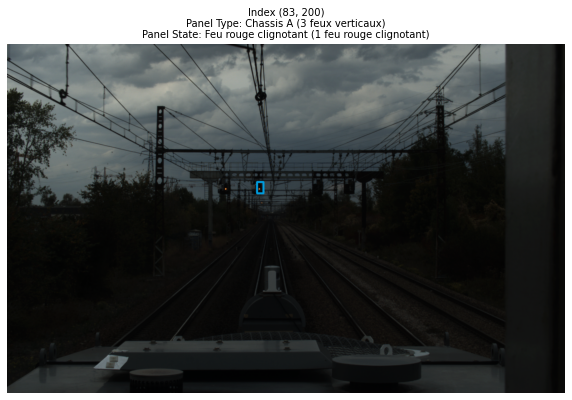

In [143]:
img_fullpath = img_folder_path + img_row.fullpath

# Read image using OpenCV
img = cv2.imread(img_fullpath, -1)
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Add bounding box to image
bounding_box_color = (0,157,223)
bounding_box_width = 6

cv2.rectangle(img_color, 
              (img_row.x, img_row.y), (img_row.x + img_row.w, img_row.y + img_row.h), 
              bounding_box_color, 
              bounding_box_width)

# Get panel type and state to create the image title
panel_type = row.type
panel_state = row.state

plt.figure(figsize=(10, 10))
plt.title("Index " + str(img_index) + "\nPanel Type: " + panel_type + "\nPanel State: " + panel_state, {"fontsize": 10})
plt.axis('off')

# Show image
plt.imshow(img_color)
plt.show()

In [9]:
# Close store
store.close()